## Style Aligned Image Generation via Shared Attention
*Emanuele Frasca, Enrico Maria Aldorasi*

This notebook contains the code to reproduce the results of the paper "**Style Aligned Image Generation via Shared Attention**".

[[Arxiv]](https://arxiv.org/abs/2312.02133) [[Project Page]](https://style-aligned-gen.github.io/)

---
## Project Abstract

The paper introduces a novel method for **style-aligned image generation**, aiming to produce images that are both **realistic** and **style-consistent** across different prompts. The method is based on a shared attention mechanism that aligns the style of the generated images using both **Adaptive Instance Normalization** (AdaIN) and modifications to normalization layers. This notebook provides an implementation of the method explaining and showing its rationale and results.

----
## Libraries and Dependencies

The main library used to implement the shared attention mechanism is the `diffusers` library by Hugging Face.

Diffusers is a library from the Hugging Face team that provides a simple and efficient way to train, sample and modify diffusion models. The core concept of the library us based on pre-built pipelines that can be easily customized to fit the user's needs.

An example of pipeline is the `StableDiffusionPipeline` Class that, for the select version of the model, provides core elements as:
- `feature_extractor`: a feature extractor that can be used to extract features from images, in this case the `CLIPImageProcessor`
- `scheduler`: a scheduler that can be used to schedule the diffusion process, in this case the `PNDMScheduler`
- `tokenizer`: a tokenizer that can be used to tokenize text, in this case the `CLIPTextModel`
- `text_encoder`: a text encoder that can be used to encode text, in this case the `CLIPTextModel`
- `unet`: a UNet model that can be used to generate images, in this case the `UNet2DConditionModel`
- `vae`: a VAE model that can be used to generate images, in this case the `AutoencoderKL`

In this notebook, we are interested in the modification of the `unet` element of the pipeline, in order to be capable to share attention between a series of images. This is done by modifying `attn1` layers, which are the self-attention layers of the UNet model.

In [1]:
%pip install diffusers torch matplotlib -q

Note: you may need to restart the kernel to use updated packages.


In [2]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

from diffusers import StableDiffusionXLPipeline, StableDiffusionPipeline, AutoPipelineForImage2Image
from diffusers.utils import load_image

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

----
## Shared Attention Functions

In order to align the styles across different generated images, we modify the attention mechanism in the UNet model used by the diffusion pipeline. The idea is to share style information between different images by manipulating the attention features.


In the context of diffusion models like Stable Diffusion, the UNet architecture includes attention layers that allow the model to focus on different parts of the image during generation. By modifying these attention layers, we can influence how the model generates images and encourage it to produce images with consistent styles.

The shared attention implemented involves the following functions that are applied to the attention features of the UNet model during image generation:

1. **Stack and scale extracted style features**: We extract style features from first and middle images, stack these style features and scale them as needed.
2. **Concatenate style features**: We concatenate the style features with the original attention features.
3. **Adaptive Instance Normalization (AdaIN)**: We apply AdaIN to align the styles by normalizing the attention features and re-scaling them using the style features.

The functions below implement these steps.

`stack_and_scale_style_features`: extract style features from specific samples in the batch and prepare them for sharing with other samples.
  - Selects the first and middle samples from the batch, which are assumed to represent different styles.
  - Stacks these samples to create a style reference.
  - Depending on the scale factor, the style features are expanded or repeated to match half the batch size.
  - Reshapes the result to match the original feature dimensions.

`concat_with_style_features`: concatenates the original features with the style features along a specified dimension.
  - Calls `stack_and_scale_style_features` to get the style features.
  - Concatenates the original features and the style features along the sequence lenght dimension.

`adain_with_style_features`: apply AdaIN to the features using the style features for mean and variance.
  - Computes the mean and standard deviation of the features along the specified dimension.
  - Uses `stack_and_scale_style_features` to obtain the expanded mean and standard deviation to match the original features.
  - Applies AdaIN to the original features using the style features.

In [3]:
def stack_and_scale_style_features(features, scale=1.0):
    batch_size = features.shape[0]  # Get the batch size

    # Select the first and middle samples from the batch
    style_samples = torch.stack((features[0], features[batch_size // 2]))  # Shape: [2, ...]
    style_samples = style_samples.unsqueeze(1)  # Add a new dimension: [2, 1, ...]

    # Depending on the scale factor, expand or repeat the style samples
    if scale == 1.0:
        # Expand the style samples to match half the batch size
        expanded_style = style_samples.expand(2, batch_size // 2, *features.shape[1:])  # Shape: [2, batch_size // 2, ...]
    else:
        # Repeat the style samples and scale
        expanded_style = style_samples.repeat(1, batch_size // 2, 1, 1, 1)  # Shape: [2, batch_size // 2, ...]
        expanded_style = torch.cat([expanded_style[:, :1], scale * expanded_style[:, 1:]], dim=1)

    # Reshape to match the original feature dimensions
    stacked_style_features = expanded_style.reshape(*features.shape)
    return stacked_style_features


def concat_with_style_features(features, dim, scale):
    # Obtain the style features
    style_features = stack_and_scale_style_features(features, scale)
    # Concatenate the original features with the style features
    concatenated_features = torch.cat((features, style_features), dim=dim)
    return concatenated_features


def adain_with_style_features(features, scale):
    # Compute the mean and variance of the features
    mean = features.mean(dim=-2, keepdim=True)
    std = torch.sqrt(features.var(dim=-2, keepdim=True) + 1e-5)

    # Obtain the expanded style mean and std
    style_mean = stack_and_scale_style_features(mean, scale)
    style_std = stack_and_scale_style_features(std, scale)

    # Normalize the features and apply the style mean and std
    normalized_features = (features - mean) / std
    adain_features = normalized_features * style_std + style_mean
    return adain_features

----
## Custom Shared Style Attention Processor Class

To integrate the shared attention mechanism into the model, we create a custom attention processor that replaces the standard self-attention in the UNet model's `attn1` layers.

The `SharedStyleAttentionProcessor` class modifies the attention computation in the `forward` method to incorporate style features.

Steps of the modified `forward` method:

1. **Compute Q, K, V**: Applies linear transformations to the hidden states to get the queries (Q), keys (K), and values (V).
2. **Reshape for Multi-Head Attention**: Reshapes and transposes Q, K, V to `[batch_size, num_heads, seq_len, head_dim]` to prepare for multi-head attention computation.
3. **Apply AdaIN to Q and K**: Uses `adain_with_style_features` to normalize and re-scale Q and K with style features. This aligns the styles in the queries and keys
4. **Concatenate Style Features to K and V**: Uses `concat_with_style_features` to concatenate the style features to K and V along the sequence length dimension.
5. **Compute Attention Output**: Uses the modified Q and K apllied to the modified V to compute scaled dot-product attention to compute the attention output.
6. **Reshape and Output Projection**: Transposes and reshapes the attention output back to the original dimensions to be used by next layer.
7. **Scaling**: Divides the output by `attn.rescale_output_factor` to maintain consistent scaling.

In [4]:
class SharedStyleAttentionProcessor(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, attn, hidden_states, **kwargs):
        # Compute queries (Q), keys (K), and values (V)
        q = attn.to_q(hidden_states)
        k = attn.to_k(hidden_states)
        v = attn.to_v(hidden_states)

        # Get dimensions
        batch_size, seq_len, embed_dim = q.shape
        num_heads = attn.heads
        head_dim = embed_dim // num_heads  # Dimension per head

        # Reshape and transpose for multi-head attention
        q = q.view(batch_size, seq_len, num_heads, head_dim).transpose(1, 2)  
        k = k.view(batch_size, seq_len, num_heads, head_dim).transpose(1, 2)
        v = v.view(batch_size, seq_len, num_heads, head_dim).transpose(1, 2)
        # Ouput size: # [batch_size, num_heads, seq_len, head_dim]

        # Apply AdaIN between queries and keys and style features to align styles
        q = adain_with_style_features(q, scale=1.0)
        k = adain_with_style_features(k, scale=1.0)

        # Concatenate style features with keys and values along sequence length dimension
        k = concat_with_style_features(k, dim=-2, scale=1.0)
        v = concat_with_style_features(v, dim=-2, scale=1.0)

        # Compute attention weights and apply to values
        attn_output = nn.functional.scaled_dot_product_attention(q, k, v, attn_mask=None, dropout_p=0.0, is_causal=False)

        # Reshape and apply output projection
        attn_output = attn_output.transpose(1, 2).reshape(batch_size, seq_len, embed_dim)
        attn_output = attn.to_out[0](attn_output).to(q.dtype)
        attn_output = attn.to_out[1](attn_output)

        # Scale output
        return attn_output / attn.rescale_output_factor

---
## Self-Attention Processors Replacing Functions

We need to replace the standard self-attention processors in the UNet model with our custom `SharedStyleAttentionProcessor`. The function `replace_self_attention_processors` handles this.

In [5]:
def replace_self_attention_processors(pipeline):
    processors = {}
    for name, processor in pipeline.unet.attn_processors.items():
        if 'attn1' in name:
            # Replace the self-attention processor with the custom one
            processors[name] = SharedStyleAttentionProcessor()
        else:
            # Keep the original processor for other attention layers
            processors[name] = processor
    # Set the new attention processors in the UNet model
    pipeline.unet.set_attn_processor(processors)

---
## Normalization Layers Functions

To further promote style sharing, we modify the normalization layers in the UNet model. We alter the `LayerNorm` and `GroupNorm` layers to include style features.

`modify_normalization_layers`:
1. **Collect Normalization Layers**:
   - Performs a depth-first search (DFS) on the UNet model to find all instances of `LayerNorm` and `GroupNorm`.
   - Collects these layers into a list.


2. **Modify the Forward Method**:
   - For each normalization layer, captures its original `forward` method.
   - Defines a new `forward` method that:
     - Uses `concat_with_style_features` to concatenate the input with style features along the feature dimension.
     - Applies the original normalization to the concatenated input.
     - Slices the output back to the original dimensions.
   - Replaces the layer's `forward` method with the new one.

In [6]:
def modify_normalization_layers(pipeline, share_group, share_layer):
    # Collect LayerNorm and GroupNorm layers
    layers = {'group': [], 'layer': []}
    stack = [pipeline.unet]
    while stack:
        module = stack.pop()
        for child in module.children():
            if isinstance(child, nn.LayerNorm) and share_layer:
                layers['layer'].append(child)
            elif isinstance(child, nn.GroupNorm) and share_group:
                layers['group'].append(child)
            else:
                stack.append(child)

    # Modify the forward method of each normalization layer
    for norm in layers['group'] + layers['layer']:
        orig_forward = norm.forward  # Save the original forward method

        # Define a new forward method
        def new_forward(x, orig=orig_forward):
            n = x.shape[-2]  # Original sequence length or feature dimension
            # Concatenate with style features
            modified_x = concat_with_style_features(x, dim=-2, scale=1.0)
            # Apply the original normalization
            x = orig(modified_x)
            # Slice back to the original dimensions
            return x[..., :n, :]

        # Replace the forward method
        norm.forward = new_forward

    return layers['group'] + layers['layer']

---
## Image Generation Function

We define a function to generate images using the modified pipeline both for text-to-image and image-to-image.

In [7]:
def generate_images(pipeline, prompts, seed, steps, input_image = None):
    # Set the random seed for reproducibility
    generator = torch.Generator(device="cuda").manual_seed(seed)
    
    with torch.no_grad():
        # Generate images only from prompts
        if input_image == None:
            output = pipeline(prompts, num_inference_steps=steps, generator=generator)
        else:
            images = input_image if isinstance(input_image, list) else [input_image] * len(prompts)
            output = pipeline(prompt=prompts, image=images, strength=0.4, guidance_scale=2.0, num_inference_steps=steps, generator=generator)
            
    return output.images

---
## Image Display Function

We define a simple function to display the images in a grid.

In [8]:
def display_images_in_grid(images, columns=3):
    num_images = len(images)
    rows = (num_images + columns - 1) // columns  # Calculate the number of rows
    plt.figure(figsize=(columns * 5, rows * 5))   # Adjust figure size

    for i, image in enumerate(images):
        plt.subplot(rows, columns, i + 1)
        plt.imshow(image)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

___
## Main Function

The `__main__` function brings everything together. It loads the pipeline, applies the modifications, generates images using the modified model, and displays the results.

In [9]:
def __main__(pipeline, prompts, seed=100, share_group=True, share_layer=True, steps=15, input_image=None):
    # Clear CUDA cache and set seed
    torch.cuda.empty_cache()
    torch.manual_seed(seed)

    # Enable attention slicing for memory optimization
    pipeline.enable_attention_slicing()
    
    # Move the pipeline to GPU
    pipeline = pipeline.to("cuda")

    # Apply modifications to the pipeline
    modify_normalization_layers(pipeline, share_group=share_group, share_layer=share_layer)
    replace_self_attention_processors(pipeline)

    # If input image is given load and resize it
    if input_image != None:
        input_image = load_image(input_image)
        width, height = input_image.size
        new_width = (width // 64) * 64
        new_height = (height // 64) * 64
        input_image = input_image.resize((new_width, new_height))
    
    # Generate images with the modified pipeline
    images = generate_images(pipeline, prompts, seed=seed, steps=steps, input_image=input_image)
    
    # Display the generated images
    display_images_in_grid(images)

    # Cleanup
    del pipeline
    del images
    torch.cuda.empty_cache()

---
## Tests

These are some test to try the outpus using different models

model_index.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/459 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/704 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/855 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.78k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

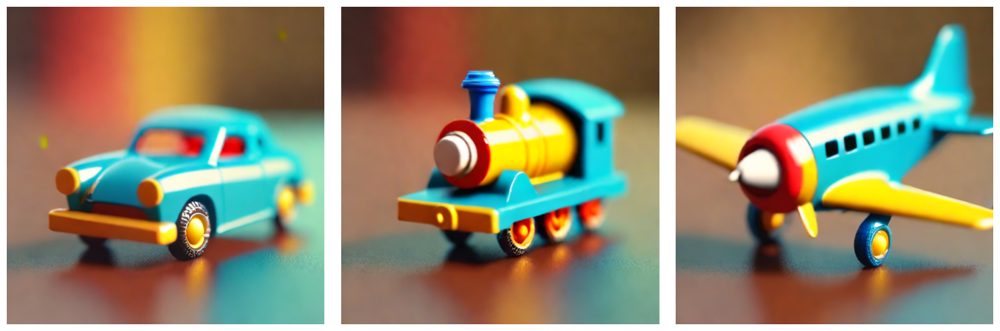

  0%|          | 0/20 [00:00<?, ?it/s]

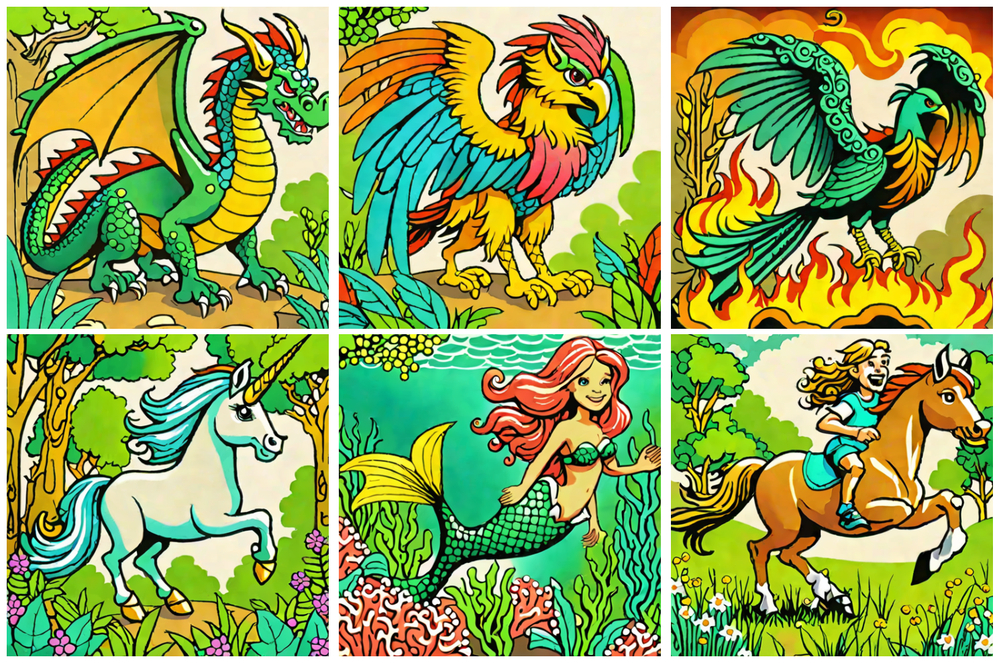

  0%|          | 0/20 [00:00<?, ?it/s]

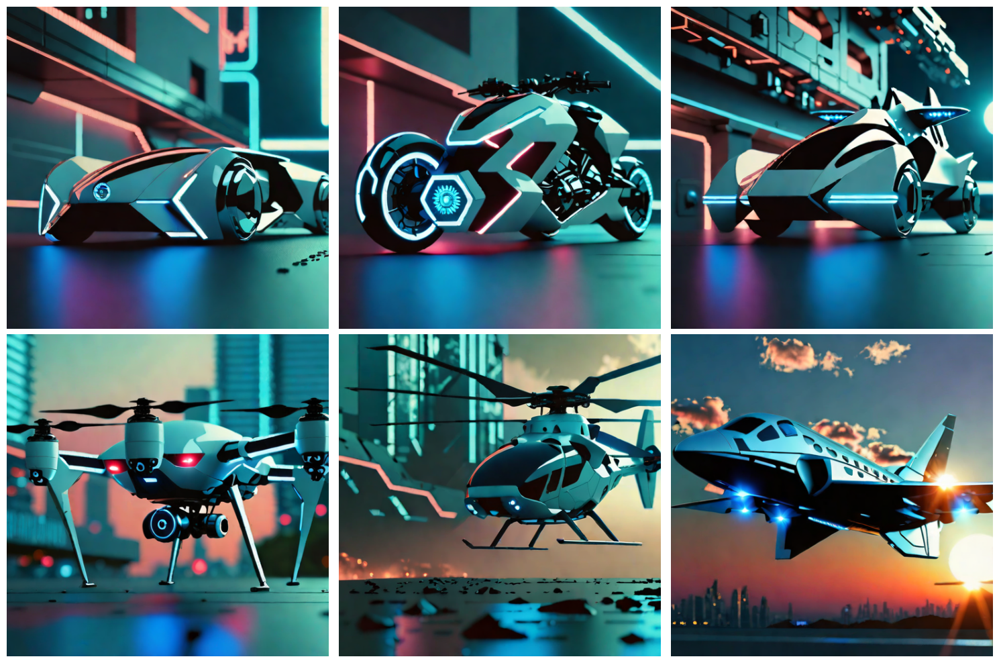

  0%|          | 0/20 [00:00<?, ?it/s]

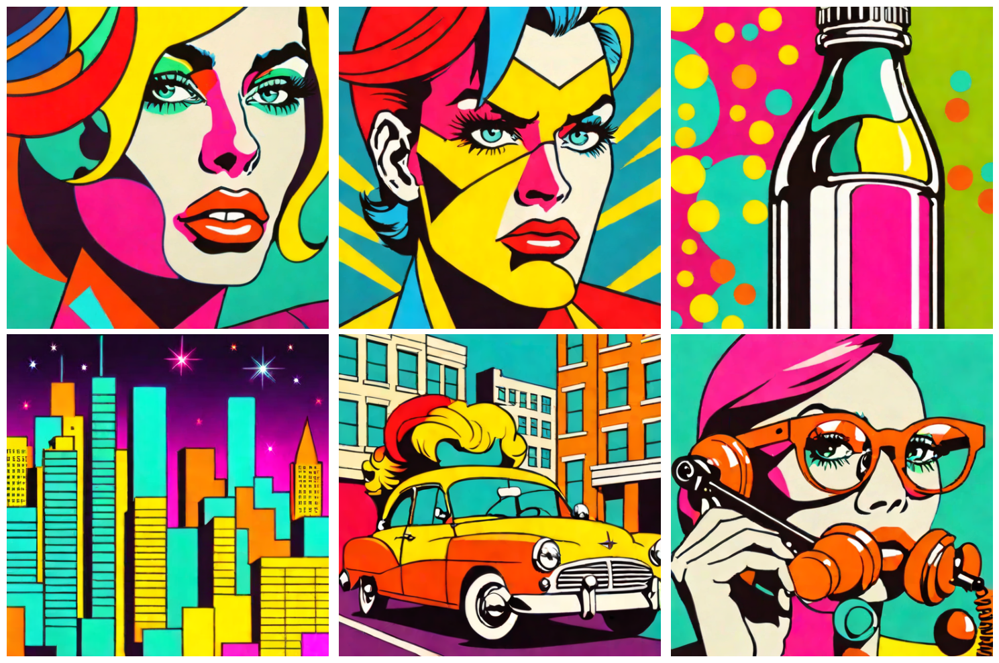

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

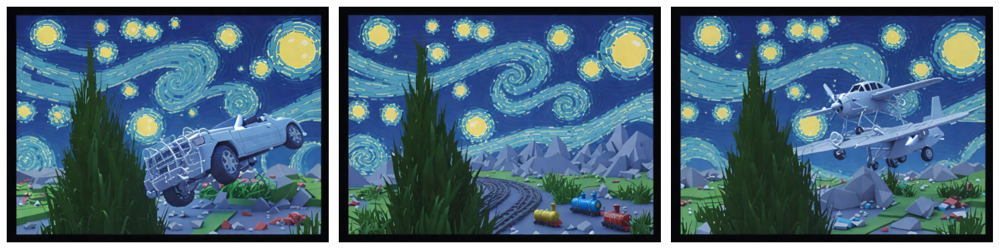

  0%|          | 0/16 [00:00<?, ?it/s]

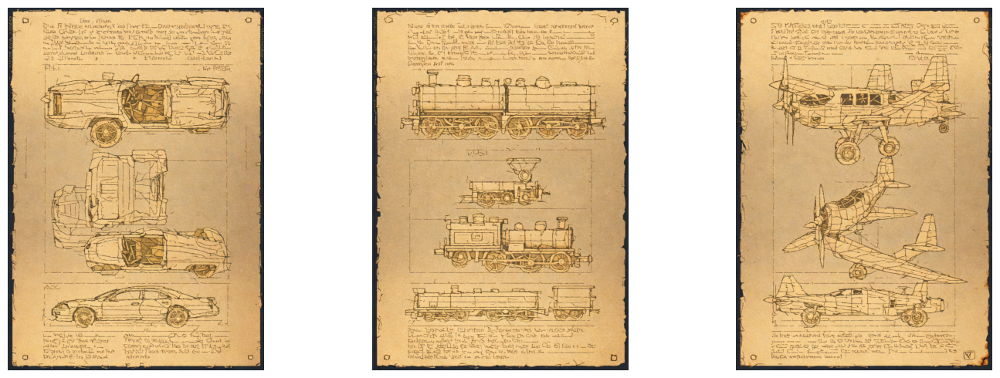

In [10]:
if __name__ == "__main__":
        
    # PROMPTS
    prompts_1 = [
        "toy car. macro photo. 3d game asset.",
        "toy train. macro photo. 3d game asset.",
        "toy airplane. macro photo. 3d game asset.",
    ]    
    
    prompts_2 = [
        "fantasy dragon. hand-drawn sketch. children's storybook illustration.",
        "fantasy griffin. colorful feathers. children's storybook illustration.",
        "fantasy phoenix. rising from flames. children's storybook illustration.",
        "fantasy unicorn. prancing through a forest. children's storybook illustration.",
        "fantasy mermaid. swimming in a coral reef. children's storybook illustration.",
        "fantasy centaur. running through a meadow. children's storybook illustration."
    ]
    
    prompts_3 = [
        "futuristic car. cinematic lighting. sci-fi movie.",
        "futuristic motorcycle. glowing edges. sci-fi movie.",
        "futuristic spaceship. in deep space. sci-fi movie.",
        "futuristic drone. hovering over a city. sci-fi movie.",
        "futuristic helicopter. flying over a dystopian landscape. sci-fi movie.",
        "futuristic jet. in the sky at sunset. sci-fi movie."
    ]
    
    prompts_4 = [
        "vibrant portrait of a woman. bold colors and abstract shapes. pop art style.",
        "retro comic book hero. bright primary colors. exaggerated features. pop art style.",
        "classic soda bottle. dotted textures and neon colors. pop art style.",
        "colorful city skyline at night. neon lights and abstract patterns. pop art style.",
        "vintage car in a bright urban setting. high contrast and bold outlines. pop art style.",
        "everyday objects like a telephone and glasses. colorful and stylized. pop art style."
    ]
    
    # DIFFUSION PIPELINES
    
    pipeline = StableDiffusionXLPipeline.from_pretrained("stabilityai/sdxl-turbo", torch_dtype=torch.float16, variant="fp16")
    #pipeline = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1-base", torch_dtype=torch.float16, variant="fp16")
    #pipeline =  StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16, variant="fp16")
    
    steps = 20

    __main__(pipeline, prompts_1, steps=steps)
    __main__(pipeline, prompts_2, steps=steps)
    __main__(pipeline, prompts_3, steps=steps)
    __main__(pipeline, prompts_4, steps=steps)
    torch.cuda.empty_cache()
    
    
    # INVERSE DIFFUSION PIPELINES
    
    input_image_path_1 = "https://abacoacanto.altervista.org/wp-content/uploads/2022/04/finalenottastellata-960x745.jpg"
    input_image_path_2 = "https://upload.wikimedia.org/wikipedia/commons/thumb/2/22/Da_Vinci_Vitruve_Luc_Viatour.jpg/800px-Da_Vinci_Vitruve_Luc_Viatour.jpg"
        
    pipeline = AutoPipelineForImage2Image.from_pretrained("stabilityai/sdxl-turbo", torch_dtype=torch.float16, variant="fp16")
    __main__(pipeline, prompts_1, steps=steps*2, input_image=input_image_path_1)
    __main__(pipeline, prompts_1, steps=steps*2, input_image=input_image_path_2)